<a href="https://colab.research.google.com/github/Kevin00404/TA047R-2C2024-GRUPO09/blob/main/TA047R_TP1_GRUPOXX_ENTREGA_EJ1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Ejercicio 1**
Ejercicio 1 del tp1 de materia Ciencia de Datos. 2c 2024

El objetivo es realizar un análisis completo del conjunto de datos, aplicar técnicas de exploración
y de preprocesamiento para poder responder algunas preguntas que se planteen sobre los
datos. En este ejercicio trabajaremos sobre un conjunto de datos sobre el uso de taxis Yellow
Cab en USA durante el año 2023 en el período de 3 meses: : Enero / Febrero /  Marzo

###Leer archivos y concatenarlos

In [ ]:
import pandas as pd

In [ ]:
#libreria para graficar
import seaborn as sns
from matplotlib import pyplot as plt

!pip install plotly_express #libreria para gráficar2
import plotly_express as px

1. Abro los 3 archivos de cada mes.
Vienen en formato .PARQUET asi que uso librería pyarrow.parquet para arbirlo.

In [ ]:
import pyarrow.parquet as pq
trips_january = pq.read_table('taxi_enero.parquet')
trips_january = trips_january.to_pandas()

In [ ]:
trips_january.shape

(3066766, 19)

¡Hay más de 3 millones de filas en el data frame de Enero!

In [ ]:
trips_february = pq.read_table('taxi_febrero.parquet')
trips_february = trips_february.to_pandas()

trips_march = pq.read_table('taxi_marzo.parquet')
trips_march = trips_march.to_pandas()


In [ ]:
trips_february.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee
0,1,2023-02-01 00:32:53,2023-02-01 00:34:34,2.0,0.30,1.0,N,142,163,2,4.4,3.50,0.5,0.0,0.0,1.0,9.40,2.5,0.00
1,2,2023-02-01 00:35:16,2023-02-01 00:35:30,1.0,0.00,1.0,N,71,71,4,-3.0,-1.00,-0.5,0.0,0.0,-1.0,-5.50,0.0,0.00
2,2,2023-02-01 00:35:16,2023-02-01 00:35:30,1.0,0.00,1.0,N,71,71,4,3.0,1.00,0.5,0.0,0.0,1.0,5.50,0.0,0.00
3,1,2023-02-01 00:29:33,2023-02-01 01:01:38,0.0,18.80,1.0,N,132,26,1,70.9,2.25,0.5,0.0,0.0,1.0,74.65,0.0,1.25
4,2,2023-02-01 00:12:28,2023-02-01 00:25:46,1.0,3.22,1.0,N,161,145,1,17.0,1.00,0.5,3.3,0.0,1.0,25.30,2.5,0.00


In [ ]:
trips_january.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,2,2023-01-01 00:32:10,2023-01-01 00:40:36,1.0,0.97,1.0,N,161,141,2,9.3,1.00,0.5,0.00,0.0,1.0,14.30,2.5,0.00
1,2,2023-01-01 00:55:08,2023-01-01 01:01:27,1.0,1.10,1.0,N,43,237,1,7.9,1.00,0.5,4.00,0.0,1.0,16.90,2.5,0.00
2,2,2023-01-01 00:25:04,2023-01-01 00:37:49,1.0,2.51,1.0,N,48,238,1,14.9,1.00,0.5,15.00,0.0,1.0,34.90,2.5,0.00
3,1,2023-01-01 00:03:48,2023-01-01 00:13:25,0.0,1.90,1.0,N,138,7,1,12.1,7.25,0.5,0.00,0.0,1.0,20.85,0.0,1.25
4,2,2023-01-01 00:10:29,2023-01-01 00:21:19,1.0,1.43,1.0,N,107,79,1,11.4,1.00,0.5,3.28,0.0,1.0,19.68,2.5,0.00


In [ ]:
trips_march.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee
0,2,2023-03-01 00:06:43,2023-03-01 00:16:43,1.0,0.00,1.0,N,238,42,2,8.6,1.0,0.5,0.00,0.0,1.0,11.10,0.0,0.00
1,2,2023-03-01 00:08:25,2023-03-01 00:39:30,2.0,12.40,1.0,N,138,231,1,52.7,6.0,0.5,12.54,0.0,1.0,76.49,2.5,1.25
2,1,2023-03-01 00:15:04,2023-03-01 00:29:26,0.0,3.30,1.0,N,140,186,1,18.4,3.5,0.5,4.65,0.0,1.0,28.05,2.5,0.00
3,1,2023-03-01 00:49:37,2023-03-01 01:01:05,1.0,2.90,1.0,N,140,43,1,15.6,3.5,0.5,4.10,0.0,1.0,24.70,2.5,0.00
4,2,2023-03-01 00:08:04,2023-03-01 00:11:06,1.0,1.23,1.0,N,79,137,1,7.2,1.0,0.5,2.44,0.0,1.0,14.64,2.5,0.00


Cambio el nombre de airport_fee por Airport_fee en el dataframe trips_january porque en los demas esta en Airport_fee y ademas porque representan lo mismo

In [ ]:
trips_january.rename(columns={'airport_fee': 'Airport_fee'}, inplace=True)

Se observa que los tres archivos tienen información relacionada con lo viajes de taxis. Tienen la misma cantidad de columnas y orden de información. Puedo concatenar los tres archivos y estudiarlos en un sólo paquete.

Junto los 3 data frames.

In [ ]:
trips=pd.concat([trips_january,trips_february,trips_march])

In [ ]:
trips.shape

(9384487, 19)

En los meses de Enero, Febrero y Marzo del 2024 se obtienen 9384487 de filas y 19 columnas.  
Voy a verificar se concatenó de manera correcta. Reviso que los 5 primeros son los mismos primeros de Enero y los últimos son los últimos de Marzo.

In [ ]:
trips.head(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee
0,2,2023-01-01 00:32:10,2023-01-01 00:40:36,1.0,0.97,1.0,N,161,141,2,9.3,1.00,0.5,0.00,0.0,1.0,14.30,2.5,0.00
1,2,2023-01-01 00:55:08,2023-01-01 01:01:27,1.0,1.10,1.0,N,43,237,1,7.9,1.00,0.5,4.00,0.0,1.0,16.90,2.5,0.00
2,2,2023-01-01 00:25:04,2023-01-01 00:37:49,1.0,2.51,1.0,N,48,238,1,14.9,1.00,0.5,15.00,0.0,1.0,34.90,2.5,0.00
3,1,2023-01-01 00:03:48,2023-01-01 00:13:25,0.0,1.90,1.0,N,138,7,1,12.1,7.25,0.5,0.00,0.0,1.0,20.85,0.0,1.25
4,2,2023-01-01 00:10:29,2023-01-01 00:21:19,1.0,1.43,1.0,N,107,79,1,11.4,1.00,0.5,3.28,0.0,1.0,19.68,2.5,0.00


In [ ]:
trips_january.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee
0,2,2023-01-01 00:32:10,2023-01-01 00:40:36,1.0,0.97,1.0,N,161,141,2,9.3,1.00,0.5,0.00,0.0,1.0,14.30,2.5,0.00
1,2,2023-01-01 00:55:08,2023-01-01 01:01:27,1.0,1.10,1.0,N,43,237,1,7.9,1.00,0.5,4.00,0.0,1.0,16.90,2.5,0.00
2,2,2023-01-01 00:25:04,2023-01-01 00:37:49,1.0,2.51,1.0,N,48,238,1,14.9,1.00,0.5,15.00,0.0,1.0,34.90,2.5,0.00
3,1,2023-01-01 00:03:48,2023-01-01 00:13:25,0.0,1.90,1.0,N,138,7,1,12.1,7.25,0.5,0.00,0.0,1.0,20.85,0.0,1.25
4,2,2023-01-01 00:10:29,2023-01-01 00:21:19,1.0,1.43,1.0,N,107,79,1,11.4,1.00,0.5,3.28,0.0,1.0,19.68,2.5,0.00


In [ ]:
trips.tail(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee
3403761,2,2023-03-31 23:24:25,2023-03-31 23:40:54,NaN,3.16,NaN,None,163,75,0,12.13,0.0,0.5,4.23,0.0,1.0,20.36,NaN,NaN
3403762,2,2023-03-31 23:24:50,2023-04-01 00:04:12,NaN,6.89,NaN,None,125,198,0,40.92,0.0,0.5,8.98,0.0,1.0,53.90,NaN,NaN
3403763,2,2023-03-31 23:26:31,2023-03-31 23:49:39,NaN,4.01,NaN,None,50,224,0,24.02,0.0,0.5,0.00,0.0,1.0,28.02,NaN,NaN
3403764,2,2023-03-31 23:07:51,2023-03-31 23:15:56,NaN,1.31,NaN,None,113,158,0,8.51,0.0,0.5,3.50,0.0,1.0,16.01,NaN,NaN
3403765,2,2023-03-31 23:26:12,2023-03-31 23:31:47,NaN,0.88,NaN,None,41,166,0,13.51,0.0,0.5,2.25,0.0,1.0,17.26,NaN,NaN


In [ ]:
trips_march.tail(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee
3403761,2,2023-03-31 23:24:25,2023-03-31 23:40:54,NaN,3.16,NaN,None,163,75,0,12.13,0.0,0.5,4.23,0.0,1.0,20.36,NaN,NaN
3403762,2,2023-03-31 23:24:50,2023-04-01 00:04:12,NaN,6.89,NaN,None,125,198,0,40.92,0.0,0.5,8.98,0.0,1.0,53.90,NaN,NaN
3403763,2,2023-03-31 23:26:31,2023-03-31 23:49:39,NaN,4.01,NaN,None,50,224,0,24.02,0.0,0.5,0.00,0.0,1.0,28.02,NaN,NaN
3403764,2,2023-03-31 23:07:51,2023-03-31 23:15:56,NaN,1.31,NaN,None,113,158,0,8.51,0.0,0.5,3.50,0.0,1.0,16.01,NaN,NaN
3403765,2,2023-03-31 23:26:12,2023-03-31 23:31:47,NaN,0.88,NaN,None,41,166,0,13.51,0.0,0.5,2.25,0.0,1.0,17.26,NaN,NaN


###Preparando los datos
Manejo inical de los datos y creación de algunas variables.

In [ ]:
trips.isna().sum()

,0
VendorID,0
tpep_pickup_datetime,0
tpep_dropoff_datetime,0
passenger_count,236179
trip_distance,0
RatecodeID,236179
store_and_fwd_flag,236179
PULocationID,0
DOLocationID,0
payment_type,0


####Creación de variables
Se agregan nuevas columnas al datframe

Creacion variable duration_time  
trip_duration: Tiempo de viaje. La variable trip duration da la duración del viaje en minutos.

In [ ]:
trips['tpep_pickup_datetime'] = pd.to_datetime(trips['tpep_pickup_datetime'])
trips['tpep_dropoff_datetime'] = pd.to_datetime(trips['tpep_dropoff_datetime'])

#  redondear a 2 decimales
trips['trip_duration'] = ((trips['tpep_dropoff_datetime'] - trips['tpep_pickup_datetime']).dt.total_seconds() / 60).round(2)

pickup_hour_minute: Hora y minuto en el que se recojió a pasajero

In [ ]:
# Extraer horas y minutos de la columna 'tpep_pickup_datetime'
trips['pickup_hour_minute'] = trips['tpep_pickup_datetime'].dt.strftime('%H:%M')

# Ver los primeros valores de la nueva columna
trips[['tpep_pickup_datetime', 'pickup_hour_minute']].head()

,tpep_pickup_datetime,pickup_hour_minute
0,2023-01-01 00:32:10,00:32
1,2023-01-01 00:55:08,00:55
2,2023-01-01 00:25:04,00:25
3,2023-01-01 00:03:48,00:03
4,2023-01-01 00:10:29,00:10


In [ ]:
trips.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9384487 entries, 0 to 3403765
Data columns (total 21 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   VendorID               int64         
 1   tpep_pickup_datetime   datetime64[us]
 2   tpep_dropoff_datetime  datetime64[us]
 3   passenger_count        float64       
 4   trip_distance          float64       
 5   RatecodeID             float64       
 6   store_and_fwd_flag     object        
 7   PULocationID           int64         
 8   DOLocationID           int64         
 9   payment_type           int64         
 10  fare_amount            float64       
 11  extra                  float64       
 12  mta_tax                float64       
 13  tip_amount             float64       
 14  tolls_amount           float64       
 15  improvement_surcharge  float64       
 16  total_amount           float64       
 17  congestion_surcharge   float64       
 18  Airport_fee            floa

####Limpieza de Datos

In [ ]:
#cantidad de filas inicial
trips.shape

(9384487, 21)

Me guardo los datos antes de limpieza.

In [ ]:
trips_original=trips.copy()

Selección más pequeña de los datos para el estudio en la limpieza de datos

In [ ]:
trips_700_mil_sin_limpiar=trips.sample(n=700000, random_state=42)

Limpieza 1

elimino todas las filas de pasajeros decimales. No puede haber 2 pasajeros y medio.

In [ ]:
import numpy as np

trips = trips.dropna(subset=['passenger_count'])
decimal_part, integer_part = np.modf(trips['passenger_count'])
trips = trips[decimal_part == 0]

In [ ]:
trips.shape

(9148308, 21)

Limpieza 2  
Borro todas las filas con pasajeros 0, 7, 8 y 9. Porque son demasiado pocos y son casos raros, que al parecer no siginifican algo,, mas bien parecen un error.

In [ ]:
#elimino filas de la cantidad de pasajeros que no tienen sentido
trips = trips[trips['passenger_count'] != 0]
trips = trips[trips['passenger_count'] != 7]
trips = trips[trips['passenger_count'] != 8]
trips = trips[trips['passenger_count'] != 9]

#forma de hacerlo en una sola linea:
# Eliminar filas con valores 0, 7, 8, 9 en la columna 'passenger_count'
#trips = trips[~trips['passenger_count'].isin([0, 7, 8, 9])]

In [ ]:
trips.shape

(8991447, 21)

Limpieza 3:  
Elimino filas con errores de tiempos muy largos con recorridos demasiado cortos.  
Sacado del análisis 7.


In [ ]:
# Filtrar filas que cumplan ambas condiciones
condicion = trips['trip_distance'].between(0, 20) & trips['trip_duration'].between(500, 10000)

# Eliminar esas filas del DataFrame
trips = trips[~condicion]

In [ ]:
trips.shape

(8983077, 21)

In [ ]:
trips = trips[trips['trip_distance'] > 0.001]

Limpieza 5  
Elimino precios negativos

In [ ]:
trips = trips[trips['fare_amount'] > 0.001]

Limpieza 6

Elimino VendorID == 6


In [ ]:
#chequeo vendor ids existentes pre limpieza
existent_vendor_ids = trips['VendorID'].unique()
print(f'\nExistent vendor IDs: {list(existent_vendor_ids)}')


Existent vendor IDs: [2, 1]


In [ ]:
# Obtener columnas con valores NaN o None
nan_columns = trips.columns[trips.isna().any()]

# Diccionario para almacenar índices de filas con NaNs o Nones por cada columna
nan_rows = {}

# Iterar sobre las columnas con NaN o None y obtener índices de filas
for column in nan_columns:
    nan_indices = trips[trips[column].isna()].index.tolist()
    nan_rows[column] = set(nan_indices)

# Verificar si todas las columnas tienen los mismos índices de filas con NaN
if len(nan_rows) > 1:
    # Obtener el primer conjunto de índices
    common_indices = list(nan_rows[next(iter(nan_rows))])

    # Encontrar diferencias
    differences = {}
    for column, indices in nan_rows.items():
        if indices != set(common_indices):
            differences[column] = sorted(indices - set(common_indices))

    if differences:
        print("\nDiferencias en índices de filas con NaNs o Nones:")
        for column, diff_indices in differences.items():
            print(f"{column} difiere en las filas: {diff_indices}")
    else:
        print("\nTodas las columnas con NaNs o Nones tienen los mismos índices de fila.")
else:
    print("Solo hay una columna con NaNs o Nones o no hay diferencias para comparar.")


Solo hay una columna con NaNs o Nones o no hay diferencias para comparar.


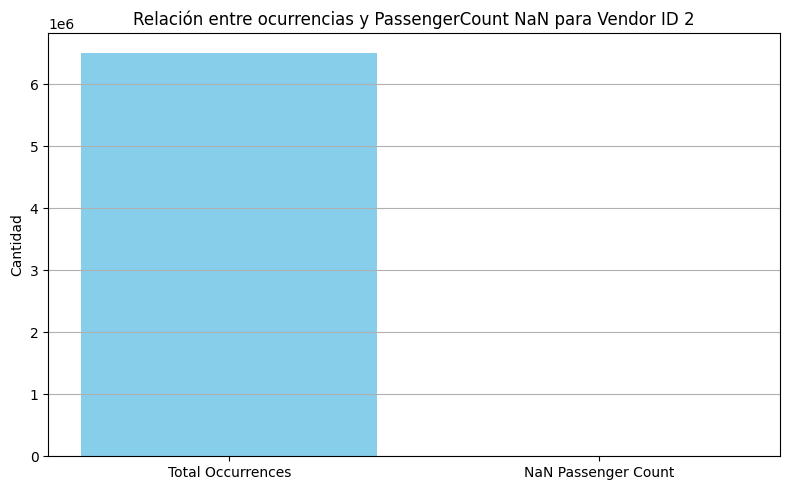

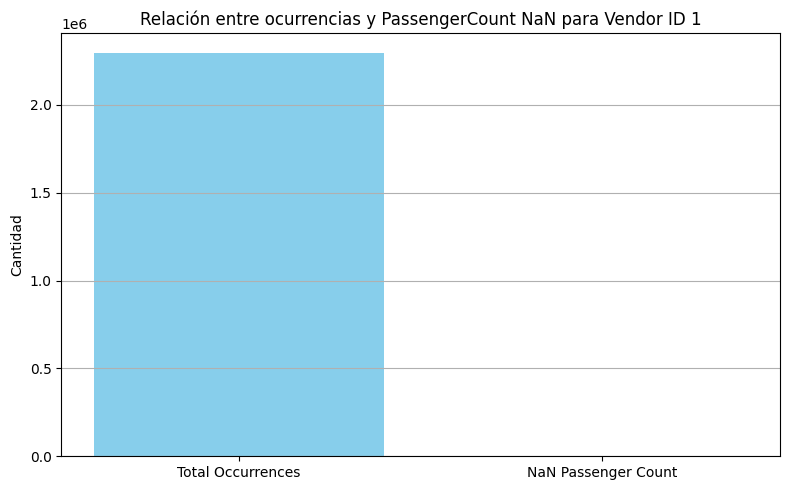

In [ ]:
import matplotlib.pyplot as plt

# Contar la frecuencia total de cada VendorID
vendor_id_counts = trips['VendorID'].value_counts()

# Filtrar los índices donde Passenger Count es NaN
nan_indices = trips.index[trips['passenger_count'].isna()]

# Contar la frecuencia de cada VendorID donde PassengerCount es NaN
vendor_id_nan_counts = trips.loc[nan_indices, 'VendorID'].value_counts()

# Crear un DataFrame para facilitar la visualización
vendor_summary = pd.DataFrame({
    'Total Occurrences': vendor_id_counts,
    'NaN Passenger Count': vendor_id_nan_counts.reindex(vendor_id_counts.index, fill_value=0)
})

# Crear gráficos para cada Vendor ID
for vendor_id in vendor_summary.index:
    plt.figure(figsize=(8,5))
    plt.bar(['Total Occurrences', 'NaN Passenger Count'],
            [vendor_summary.loc[vendor_id, 'Total Occurrences'], vendor_summary.loc[vendor_id, 'NaN Passenger Count']],
            color=['skyblue', 'salmon'])
    plt.title(f'Relación entre ocurrencias y PassengerCount NaN para Vendor ID {vendor_id}')
    plt.ylabel('Cantidad')
    plt.xticks(rotation=0)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()


In [ ]:
# chequeo resumen
print(vendor_summary)

          Total Occurrences  NaN Passenger Count
VendorID                                        
2                   6504904                    0
1                   2294350                    0


In [ ]:
total_counts = vendor_id_counts.sum()
vendor_id_percentage = (vendor_id_counts / total_counts) * 100

# Crear un DataFrame con los resultados
vendor_id_summary = pd.DataFrame({
    'Count': vendor_id_counts,
    'Percentage': vendor_id_percentage
})

# Imprimir el resumen
print(vendor_id_summary)

            Count  Percentage
VendorID                     
2         6504904   73.925631
1         2294350   26.074369


Podemos ver que la relación de passenger count y vendor id 6 es de 1:1 a diferencia de la de passenger count con los otros vendor ids. Además que el porcentaje de ocurrencias del vendor id 6 es extremadamente bajo a diferencia de los otros. Por estas razones consideramos eliminar las filas relacionadas a vendor id 6.



In [ ]:
# Eliminar filas donde VendorID es 6
trips = trips.drop(trips[trips['VendorID'] == 6].index)

# Restablecer indice
trips.reset_index(drop=True, inplace=True)

# chequeo ocurrencias de cada vendor post limpieza
ocurrencias = trips['VendorID'].value_counts()

# Mostrar las ocurrencias
print("Ocurrencias de cada vendorid:")
print(ocurrencias)

Ocurrencias de cada vendorid:
VendorID
2    6504904
1    2294350
Name: count, dtype: int64


#####Declaro Dataframes
Con las variables ya creadas y el dataframe limpio

In [ ]:
trips_data_total= trips.sample(n=700000, random_state=42)

In [ ]:
# Seleccionar una muestra de 10,000 filas aleatorias
trips = trips.sample(n=10000, random_state=42)

###Índice

In [ ]:
trips.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10000 entries, 4827457 to 8400821
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   VendorID               10000 non-null  int64         
 1   tpep_pickup_datetime   10000 non-null  datetime64[us]
 2   tpep_dropoff_datetime  10000 non-null  datetime64[us]
 3   passenger_count        10000 non-null  float64       
 4   trip_distance          10000 non-null  float64       
 5   RatecodeID             10000 non-null  float64       
 6   store_and_fwd_flag     10000 non-null  object        
 7   PULocationID           10000 non-null  int64         
 8   DOLocationID           10000 non-null  int64         
 9   payment_type           10000 non-null  int64         
 10  fare_amount            10000 non-null  float64       
 11  extra                  10000 non-null  float64       
 12  mta_tax                10000 non-null  float64       
 13

In [ ]:
trips.describe()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,trip_duration
count,10000.000000,10000,10000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,1.748300,2023-02-16 01:57:28.224000,2023-02-16 02:12:28.507700,1.368700,4.471784,1.517600,164.615000,164.469500,1.186700,18.732978,1.579500,0.497490,3.486926,0.544041,0.999100,27.669765,2.326500,0.106750,15.004698
min,1.000000,2023-01-01 00:04:37,2023-01-01 00:18:24,1.000000,0.010000,1.000000,1.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.500000,0.000000,0.000000,0.050000
25%,1.000000,2023-01-24 22:21:04.500000,2023-01-24 22:46:13,1.000000,1.100000,1.000000,132.000000,114.000000,1.000000,9.300000,0.000000,0.500000,1.000000,0.000000,1.000000,15.750000,2.500000,0.000000,7.370000
50%,2.000000,2023-02-16 02:28:13.500000,2023-02-16 02:57:40,1.000000,1.800000,1.000000,161.000000,162.000000,1.000000,12.800000,1.000000,0.500000,2.860000,0.000000,1.000000,20.520000,2.500000,0.000000,11.950000
75%,2.000000,2023-03-10 10:26:54.250000,2023-03-10 10:39:37.250000,1.000000,3.332500,1.000000,233.000000,234.000000,1.000000,20.500000,2.500000,0.500000,4.260000,0.000000,1.000000,28.920000,2.500000,0.000000,18.785000
max,2.000000,2023-03-31 23:47:56,2023-04-01 00:07:25,6.000000,10776.300000,99.000000,265.000000,265.000000,4.000000,375.000000,11.250000,4.000000,51.310000,50.080000,1.000000,383.800000,2.500000,1.250000,138.950000
std,0.434011,NaN,NaN,0.874321,107.819305,6.706846,63.561506,68.807586,0.434122,17.316434,1.770697,0.052163,3.794422,2.097749,0.026254,21.754309,0.635365,0.349362,11.466792


In [ ]:
trips.isnull().sum() #suma de los NULL de columnas

,0
VendorID,0
tpep_pickup_datetime,0
tpep_dropoff_datetime,0
passenger_count,0
trip_distance,0
RatecodeID,0
store_and_fwd_flag,0
PULocationID,0
DOLocationID,0
payment_type,0


Análisis1:
Las siguiente variables son NULL cada vez que no hay un pasajero, podriamos cambiar de NULL a alguna variable que nos interese segun el tipo de viaje que fue, por ejemplo la de RatecodID indica que tipo de viaje fue, podriamos inventar un nuevo tipo que seria cancelado.:  
passenger_count  
RatecodeID  
store_and_fwd_flag  
congestion_surcharge

In [ ]:
(trips['RatecodeID'].value_counts(normalize=False)
 .to_frame('Count')
 .assign(Percentage=lambda x: 100 * x['Count'] / x['Count'].sum())
)

,Count,Percentage
RatecodeID,,
1.0,9533,95.33
2.0,341,3.41
99.0,47,0.47
3.0,34,0.34
5.0,26,0.26
4.0,19,0.19


Análisis 3: en Variable RatecodeID el type 99.0 no es un type indicado en el data_dictionary_trip_records_yellow.  
¿Qué hacemos con esa variable?

###Análisis de cada variable

####VendorID


In [ ]:
trips.VendorID.value_counts()

,count
VendorID,
2,7483
1,2517


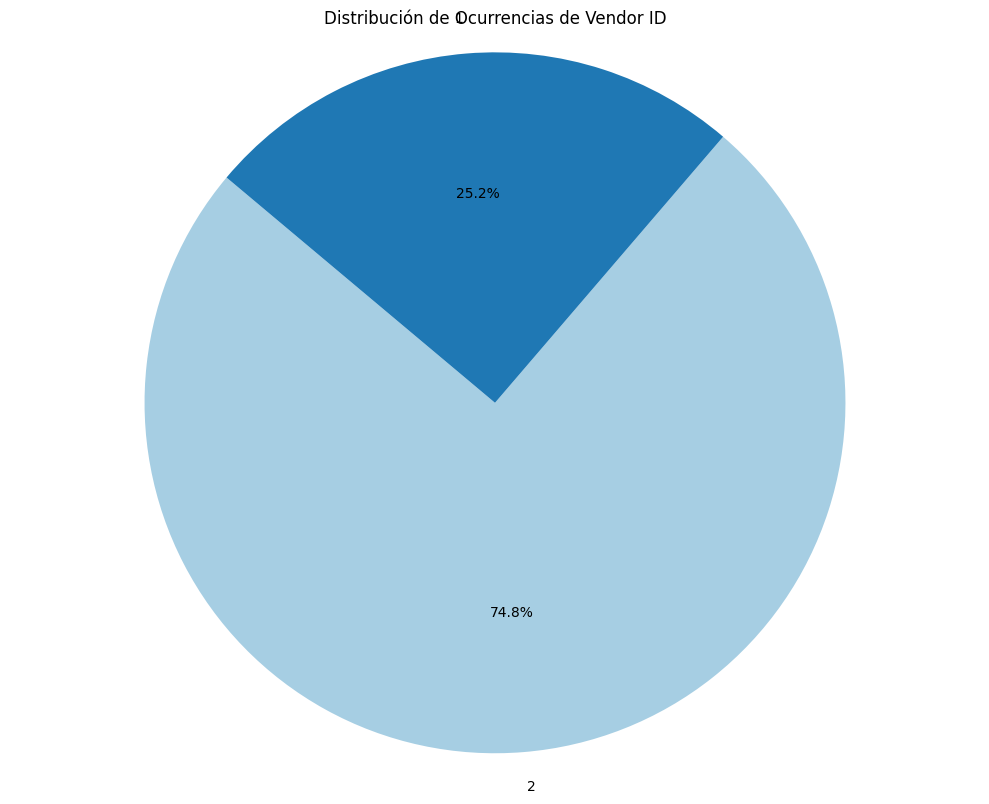

In [ ]:
vendor_id_counts = trips['VendorID'].value_counts()
# pie chart
plt.figure(figsize=(10, 8))
plt.pie(vendor_id_counts,
        labels=vendor_id_counts.index,
        autopct='%1.1f%%',
        startangle=140,
        colors=plt.cm.Paired.colors)


plt.title('Distribución de Ocurrencias de Vendor ID')
plt.axis('equal')

# Mostrar el gráfico
plt.tight_layout()
plt.show()

In [ ]:
trips.describe()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,trip_duration
count,10000.000000,10000,10000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,1.748300,2023-02-16 01:57:28.224000,2023-02-16 02:12:28.507700,1.368700,4.471784,1.517600,164.615000,164.469500,1.186700,18.732978,1.579500,0.497490,3.486926,0.544041,0.999100,27.669765,2.326500,0.106750,15.004698
min,1.000000,2023-01-01 00:04:37,2023-01-01 00:18:24,1.000000,0.010000,1.000000,1.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.500000,0.000000,0.000000,0.050000
25%,1.000000,2023-01-24 22:21:04.500000,2023-01-24 22:46:13,1.000000,1.100000,1.000000,132.000000,114.000000,1.000000,9.300000,0.000000,0.500000,1.000000,0.000000,1.000000,15.750000,2.500000,0.000000,7.370000
50%,2.000000,2023-02-16 02:28:13.500000,2023-02-16 02:57:40,1.000000,1.800000,1.000000,161.000000,162.000000,1.000000,12.800000,1.000000,0.500000,2.860000,0.000000,1.000000,20.520000,2.500000,0.000000,11.950000
75%,2.000000,2023-03-10 10:26:54.250000,2023-03-10 10:39:37.250000,1.000000,3.332500,1.000000,233.000000,234.000000,1.000000,20.500000,2.500000,0.500000,4.260000,0.000000,1.000000,28.920000,2.500000,0.000000,18.785000
max,2.000000,2023-03-31 23:47:56,2023-04-01 00:07:25,6.000000,10776.300000,99.000000,265.000000,265.000000,4.000000,375.000000,11.250000,4.000000,51.310000,50.080000,1.000000,383.800000,2.500000,1.250000,138.950000
std,0.434011,NaN,NaN,0.874321,107.819305,6.706846,63.561506,68.807586,0.434122,17.316434,1.770697,0.052163,3.794422,2.097749,0.026254,21.754309,0.635365,0.349362,11.466792


Tipos:  
 Descrpción de la variable: El VendorID en el dataset indica cuál de estas empresas proporcionó el sistema de taxímetro que generó el registro del viaje.

1: Creative Mobile Technologies, LLC: Esta empresa es una de las proveedoras de sistemas de taxímetro y soluciones de pago para taxis en la ciudad. Sus sistemas permiten la gestión de pagos y la recopilación de datos de los viajes.

2: VeriFone Inc.: Otra empresa que ofrece soluciones de procesamiento de pagos y sistemas de taxímetro. Sus dispositivos se utilizan en taxis para registrar y procesar las tarifas de los viajes.  
  
6: No definido. Un 0.033% del total.




Para ver el los valores cuantitativos de todo el data frame:

In [ ]:
# Convertir todas las columnas que se puedan a números y reemplazar los no numéricos con NaN
trips_clean = trips.apply(pd.to_numeric, errors='coerce')

# resumen estadístico
resumen_completo = trips_clean.describe().T

#La merdiana es el 50%
# Agrego moda
resumen_completo['moda'] = trips_clean.mode().iloc[0]

resumen_completo

,count,mean,std,min,25%,50%,75%,max,moda
VendorID,10000.0,1.748300e+00,4.340115e-01,1.000000e+00,1.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00
tpep_pickup_datetime,10000.0,1.676513e+15,2.227070e+12,1.672531e+15,1.674599e+15,1.676514e+15,1.678444e+15,1.680306e+15,1.675030e+15
tpep_dropoff_datetime,10000.0,1.676514e+15,2.227097e+12,1.672532e+15,1.674600e+15,1.676516e+15,1.678445e+15,1.680308e+15,1.673609e+15
passenger_count,10000.0,1.368700e+00,8.743207e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,6.000000e+00,1.000000e+00
trip_distance,10000.0,4.471784e+00,1.078193e+02,1.000000e-02,1.100000e+00,1.800000e+00,3.332500e+00,1.077630e+04,8.000000e-01
RatecodeID,10000.0,1.517600e+00,6.706846e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,9.900000e+01,1.000000e+00
store_and_fwd_flag,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PULocationID,10000.0,1.646150e+02,6.356151e+01,1.000000e+00,1.320000e+02,1.610000e+02,2.330000e+02,2.650000e+02,1.320000e+02
DOLocationID,10000.0,1.644695e+02,6.880759e+01,1.000000e+00,1.140000e+02,1.620000e+02,2.340000e+02,2.650000e+02,2.360000e+02
payment_type,10000.0,1.186700e+00,4.341221e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,4.000000e+00,1.000000e+00


Análisis Gráfico

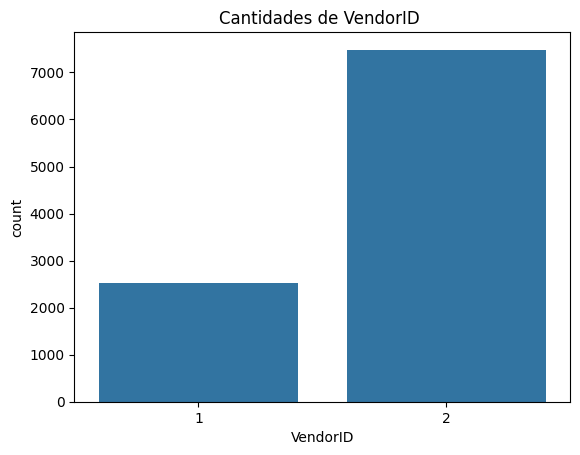

In [ ]:
#Grafico de Barras
sns.countplot(x='VendorID', data=trips).set(title='Cantidades de VendorID ')
plt.show()

####Passenger Count
Número de pasajeros en el viaje del taxi.  


In [ ]:
(trips['passenger_count'].value_counts(normalize=False)
 .to_frame('Count')
 .assign(Percentage=lambda x: 100 * x['Count'] / x['Count'].sum())
)

,Count,Percentage
passenger_count,,
1.0,7783,77.83
2.0,1485,14.85
3.0,336,3.36
4.0,162,1.62
5.0,126,1.26
6.0,108,1.08


Grafico de la cantidad de pasajeros
¿por qué hay 0 pasajeros en casi 2% de los viajes?  
¿los valores 7, 8, 9 son posibles?, ¿podrían haber sido taxis doble cabina?

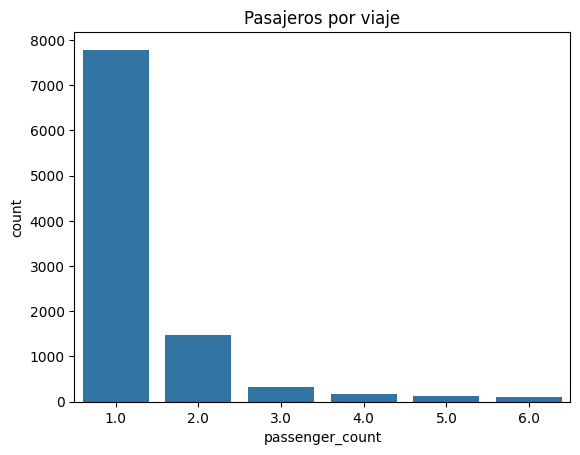

In [ ]:
#Grafico de Barras
trips = trips.reset_index(drop=True)
sns.countplot(x='passenger_count', data=trips).set(title='Pasajeros por viaje')
plt.show()

In [ ]:
trips['passenger_count'].unique() #los valores que tiene

array([1., 2., 4., 3., 5., 6.])

####trip_duration
Duracion del viaje en minutos.

In [ ]:
(trips['trip_duration'].value_counts(normalize=False)
 .to_frame('Count')
)

,Count
trip_duration,
6.12,21
5.83,18
14.43,18
7.35,17
9.37,17
...,...
28.22,1
46.33,1
39.32,1


In [ ]:
# Filtrar los datos para incluir solo duraciones entre 0 y 70 minutos
trips_filtered = trips[trips['trip_duration'].between(0, 60)]

# Crear un histograma con los datos filtrados
fig = px.histogram(trips_filtered, x='trip_duration', nbins=100, title='Distribución de la duración de los viajes (0-60 mins)')
fig.show()


In [ ]:
trips_filtered = trips_data_total[trips_data_total['trip_duration'].between(0, 40)]
px.box(trips_filtered, x='trip_duration', title='Distribución de la duración de los viajes')

In [ ]:
px.violin(trips_filtered, x='trip_duration')

####payment_type
Tipo de pago  

A numeric code signifying how the passenger paid for the trip.  
1= Credit card  
2= Cash  
3= No charge  
4= Dispute  
5= Unknown  
6= Voided trip  

In [ ]:
trips['payment_type'].unique()

array([1, 2, 4, 3])

In [ ]:
payment_mapping = {
    1: 'Credit card',
    2: 'Cash',
    3: 'No charge',
    4: 'Dispute',
    5: 'Unknown',
    6: 'Voided trip'
}

# populo null payment types antes de mappear como "Unknown"
trips['payment_type'].fillna(5, inplace=True)

# mappeo
trips['payment_type_desc'] = trips['payment_type'].map(payment_mapping)

# tabla con el conteo y porcentaje
payment_summary = (
    trips['payment_type_desc'].value_counts(normalize=False)
    .to_frame('Count')
    .assign(Percentage=lambda x: 100 * x['Count'] / x['Count'].sum())
)
payment_summary


<ipython-input-56-e263ca9d830c>:11: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





,Count,Percentage
payment_type_desc,,
Credit card,8264,82.64
Cash,1657,16.57
Dispute,52,0.52
No charge,27,0.27


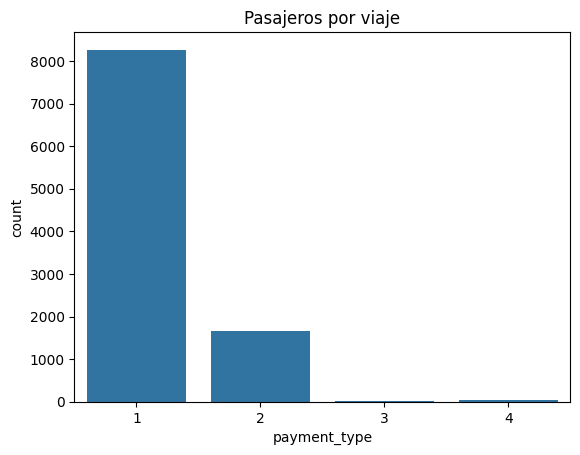

In [ ]:
#Grafico de Barras
trips = trips.reset_index(drop=True)
sns.countplot(x='payment_type', data=trips).set(title='Pasajeros por viaje')
plt.show()

In [ ]:
# Diccionario para mapear los valores numéricos a descripciones
payment_mapping = {
    1: 'Credit card',
    2: 'Cash',
    3: 'No charge',
    4: 'Dispute',
    5: 'Unknown',
    6: 'Voided trip'
}

# populo null payment types antes de mappear como "Unknown"
trips['payment_type'].fillna(5, inplace=True)

# Aplicar el mapeo a la columna 'payment_type'
trips['payment_type_desc'] = trips['payment_type'].map(payment_mapping)

# Crear el gráfico circular usando la columna con descripciones
fig = px.pie(trips, names='payment_type_desc', title='Distribución de los tipos de pago')
fig.show()

<ipython-input-58-8fba6db704b2>:12: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





####Trip_distance
La distancia del viaje transcurrido en millas reportadas por el taxímetro

[Text(0.5, 1.0, 'Distribución de la distancia en millas')]

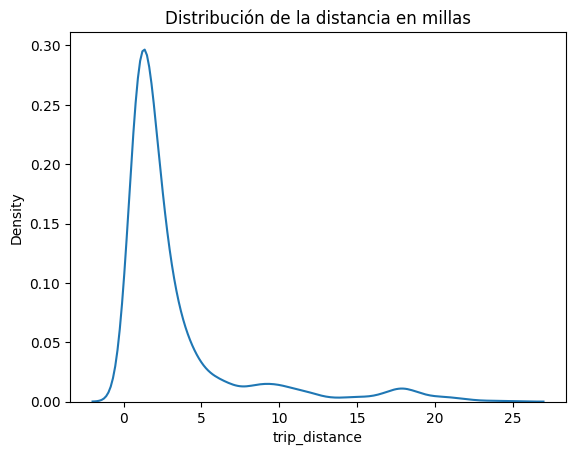

In [ ]:
trips_filter_distance = trips[trips['trip_distance'].between(0, 25)]
sns.kdeplot(trips_filter_distance, x='trip_distance').set(title='Distribución de la distancia en millas')

In [ ]:
trips_filter_distance = trips[trips['trip_distance'].between(0, 6)]
px.box(trips_filter_distance, x='trip_distance', title='Distribución de la distancia en millas. distancia en millas')

Voy a grupar los datos de numeros continguos en concretos para hacer estudios en rangos.

In [ ]:
# Definir los intervalos de agrupación
bins = [0, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5,8.5,9.5,10.5,11.5,12.5,13.5,14.5,15.5,16.5,17.5,18.5,19.5,20.5,21.5,22.5,23.5]
labels = [1, 2, 3, 4, 5, 6, 7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]  # Valores que representarán cada rango

# ueva columna que agrupa los valores de trip_distance
trips['trip_distance_group'] = pd.cut(trips['trip_distance'], bins=bins, labels=labels, right=False)
#análisis de recuento y porcentaje por grupo
grouped_trip_distance = (trips['trip_distance_group'].value_counts(normalize=False)
                         .to_frame('Count')
                         .assign(Percentage=lambda x: 100 * x['Count'] / x['Count'].sum()))

In [ ]:
grouped_trip_distance = grouped_trip_distance[grouped_trip_distance.index.isin([1, 2, 3, 4, 5, 6, 7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23])]

print(grouped_trip_distance)

                     Count  Percentage
trip_distance_group                   
1                     4047   40.591775
2                     2456   24.633902
3                     1109   11.123370
4                      574    5.757272
5                      303    3.039117
6                      204    2.046138
9                      154    1.544634
10                     141    1.414243
7                      133    1.334002
18                     127    1.273821
8                      124    1.243731
11                     103    1.033099
17                      87    0.872618
12                      83    0.832497
19                      71    0.712136
15                      43    0.431294
20                      42    0.421264
16                      36    0.361083
21                      36    0.361083
13                      35    0.351053
14                      33    0.330993
22                      24    0.240722
23                       5    0.050150


In [ ]:
grouped_trip_distance = grouped_trip_distance[grouped_trip_distance.index.isin([1, 2, 3, 4, 5, 6, 7])]

print(grouped_trip_distance)

                     Count  Percentage
trip_distance_group                   
1                     4047   40.591775
2                     2456   24.633902
3                     1109   11.123370
4                      574    5.757272
5                      303    3.039117
6                      204    2.046138
7                      133    1.334002


####RateCodeID
La variable RateCodeID es el tipo de tarifa aplicada al final del viaje. Los códigos de tarifa:

1. Standard rate: Tarifa estándar para viajes dentro de la ciudad.  
2. JFK: Tarifa fija para viajes hacia o desde el Aeropuerto JFK.  
3. Newark: Tarifa para viajes hacia o desde Newark.  
4. Nassau or Westchester: Tarifa para viajes hacia Nassau o el condado de Westchester.  
5. Negotiated fare: Tarifa negociada, es decir, una tarifa acordada entre el conductor y el pasajero antes del viaje.


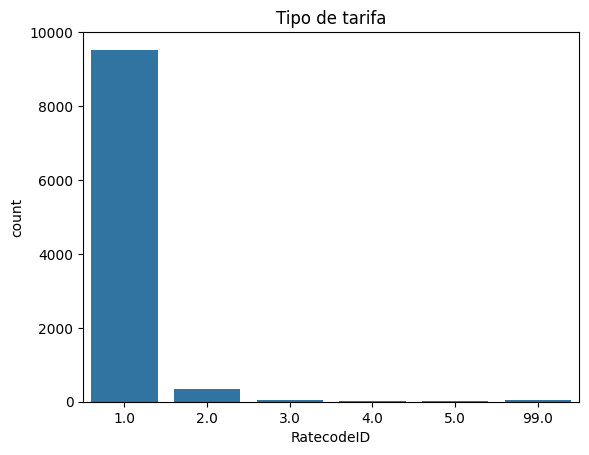

In [ ]:
#Grafico de Barras
trips = trips.reset_index(drop=True)
sns.countplot(x='RatecodeID', data=trips).set(title='Tipo de tarifa')
plt.show()

In [ ]:
(trips['RatecodeID'].value_counts(normalize=False)
 .to_frame('Count')
 .assign(Percentage=lambda x: 100 * x['Count'] / x['Count'].sum())
)

,Count,Percentage
RatecodeID,,
1.0,9533,95.33
2.0,341,3.41
99.0,47,0.47
3.0,34,0.34
5.0,26,0.26
4.0,19,0.19


Asumiendo que el tipo 99 no es nada, y represent un porcentaje bastante bajo, voy a eliminar todas sus filas

In [ ]:
trips = trips[trips['RatecodeID'] != 99]

####Fare_amount
Valor del viaje. Respecto a el tiempo y la distancia, calculada por el taxímetro durante el viaje. Es el costo básico del viaje antes de añadir impuestos, recargos u otros ajustes.

[Text(0.5, 1.0, 'Distribución de la distancia en millas')]

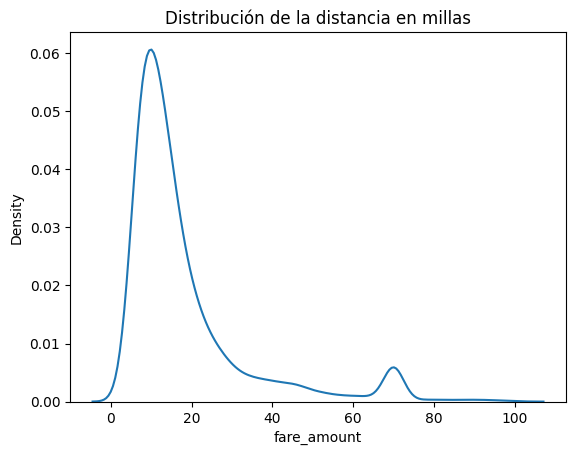

In [ ]:
trips_filter_fare = trips[trips['fare_amount'].between(0,100 )]
sns.kdeplot(trips_filter_fare, x='fare_amount').set(title='Distribución de la distancia en millas')

In [ ]:
trips_filter_fare = trips[trips['fare_amount'].between(0,45 )]
px.box(trips_filter_fare, x='fare_amount', title='Precio de viaje sin impuestos, ni recargos. ')

In [ ]:
#defino unas variables para los costos
barato=[1,8.6]
medio=[9.1,17.5]
alto=[17.6,500]

Agrupo valores#TODO que es esto

In [ ]:
# Definir los intervalos de agrupación
bins = [0, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5, 9.5, 10.5, 11.5, 12.5, 13.5, 14.5, 15.5, 16.5,
        17.5, 18.5, 19.5, 20.5, 21.5, 22.5, 23.5, 24.5, 25.5, 26.5, 27.5, 28.5, 29.5, 30.5,
        31.5, 32.5, 33.5, 34.5, 35.5, 36.5, 37.5, 38.5, 39.5, 40.5, 41.5, 42.5, 43.5, 44.5,
        45.5, 46.5, 47.5, 48.5, 49.5, 50.5, 51.5, 52.5, 53.5, 54.5, 55.5, 56.5, 57.5, 58.5,
        59.5, 60.5, 61.5, 62.5, 63.5, 64.5, 65.5, 66.5, 67.5, 68.5, 69.5, 70.5, 71.5, 72.5,
        73.5, 74.5, 75.5, 76.5, 77.5, 78.5, 79.5, 80.5]
labels = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
          24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
          45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64,
          65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]  # Valores que representarán cada rango

# ueva columna que agrupa los valores de trip_distance
trips['trip_amount_group'] = pd.cut(trips['fare_amount'], bins=bins, labels=labels, right=False)
#análisis de recuento y porcentaje por grupo
grouped_fare_distance = (trips['trip_amount_group'].value_counts(normalize=False)
                         .to_frame('Count')
                         .assign(Percentage=lambda x: 100 * x['Count'] / x['Count'].sum()))

In [ ]:
grouped_fare_distance = grouped_fare_distance[grouped_fare_distance.index.isin([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
          24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
          45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64,
          65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80])]

print(grouped_trip_distance)

                     Count  Percentage
trip_distance_group                   
1                     4047   40.591775
2                     2456   24.633902
3                     1109   11.123370
4                      574    5.757272
5                      303    3.039117
6                      204    2.046138
7                      133    1.334002


#### Total_amount

In [ ]:
trips['total_amount'].value_counts()

,count
total_amount,
12.60,169
16.80,125
21.00,117
15.96,92
19.32,92
...,...
58.85,1
37.35,1
71.71,1


Verifico si el total_amount coincide con la suma de las demas variables que influyen en el precio del viaje

In [ ]:
trips[trips['total_amount'] != trips['fare_amount'] + trips['extra'] +  trips['mta_tax'] +	trips['tip_amount'] +	trips['tolls_amount'] + trips['improvement_surcharge'] + trips['congestion_surcharge']	+ trips['Airport_fee']]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,trip_duration,pickup_hour_minute,payment_type_desc,trip_distance_group,trip_amount_group
0,1,2023-02-21 06:15:44,2023-02-21 06:20:35,1.0,1.00,1.0,N,186,230,1,...,0.0,1.0,13.20,2.5,0.00,4.85,06:15,Credit card,1,7
1,1,2023-03-03 13:21:03,2023-03-03 13:32:02,1.0,1.20,1.0,N,229,237,2,...,0.0,1.0,14.00,2.5,0.00,10.98,13:21,Cash,1,10
2,1,2023-03-18 02:22:36,2023-03-18 02:31:10,1.0,1.30,1.0,N,238,236,1,...,0.0,1.0,18.00,2.5,0.00,8.57,02:22,Credit card,1,10
3,1,2023-03-13 09:38:56,2023-03-13 09:51:02,1.0,1.20,1.0,N,161,141,1,...,0.0,1.0,19.30,2.5,0.00,12.10,09:38,Credit card,1,12
5,1,2023-03-07 15:14:27,2023-03-07 16:01:24,1.0,14.30,1.0,N,132,112,1,...,0.0,1.0,75.80,0.0,1.25,46.95,15:14,Credit card,14,60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,1,2023-02-08 10:01:37,2023-02-08 10:07:59,1.0,1.00,1.0,N,237,142,1,...,0.0,1.0,15.10,2.5,0.00,6.37,10:01,Credit card,1,9
9987,2,2023-02-11 14:31:00,2023-02-11 14:36:24,1.0,0.54,1.0,N,236,236,1,...,0.0,1.0,13.44,2.5,0.00,5.40,14:31,Credit card,1,7
9989,1,2023-03-15 02:44:48,2023-03-15 02:48:12,3.0,0.50,1.0,N,211,144,1,...,0.0,1.0,13.10,2.5,0.00,3.40,02:44,Credit card,1,5
9994,1,2023-03-03 11:22:59,2023-03-03 11:33:04,1.0,1.00,1.0,N,229,237,1,...,0.0,1.0,15.95,2.5,0.00,10.08,11:22,Credit card,1,9


Modificamos aquellos valores que sean distintos a la suma de las varibles

In [ ]:
trips.loc[trips['total_amount'] != trips['fare_amount'] + trips['extra'] + trips['mta_tax'] +	trips['tip_amount'] +	trips['tolls_amount'] + trips['improvement_surcharge'] + trips['congestion_surcharge']	+ trips['Airport_fee'], ['total_amount']] = trips['fare_amount'] + trips['extra'] + trips['mta_tax'] + trips['tip_amount'] +	trips['tolls_amount'] + trips['improvement_surcharge'] + trips['congestion_surcharge']	+ trips['Airport_fee']
trips[trips['total_amount'] != trips['fare_amount'] + trips['extra'] +  trips['mta_tax'] +	trips['tip_amount'] +	trips['tolls_amount'] + trips['improvement_surcharge'] + trips['congestion_surcharge']	+ trips['Airport_fee']]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,trip_duration,pickup_hour_minute,payment_type_desc,trip_distance_group,trip_amount_group


Verificamos si hay algun valor menor a cero

In [ ]:
trips[trips['total_amount'] < 0]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,trip_duration,pickup_hour_minute,payment_type_desc,trip_distance_group,trip_amount_group


In [ ]:
px.box(trips, x='total_amount', title='Total amount')

####Finalizando analisis de cada variables individualmente

In [ ]:
trips.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9953 entries, 0 to 9999
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   VendorID               9953 non-null   int64         
 1   tpep_pickup_datetime   9953 non-null   datetime64[us]
 2   tpep_dropoff_datetime  9953 non-null   datetime64[us]
 3   passenger_count        9953 non-null   float64       
 4   trip_distance          9953 non-null   float64       
 5   RatecodeID             9953 non-null   float64       
 6   store_and_fwd_flag     9953 non-null   object        
 7   PULocationID           9953 non-null   int64         
 8   DOLocationID           9953 non-null   int64         
 9   payment_type           9953 non-null   int64         
 10  fare_amount            9953 non-null   float64       
 11  extra                  9953 non-null   float64       
 12  mta_tax                9953 non-null   float64       
 13  tip_amou

In [ ]:
trips.describe()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,trip_duration
count,9953.000000,9953,9953,9953.000000,9953.000000,9953.000000,9953.000000,9953.000000,9953.000000,9953.000000,9953.000000,9953.000000,9953.000000,9953.000000,9953.000000,9953.000000,9953.000000,9953.000000,9953.000000
mean,1.751834,2023-02-16 01:29:52.168893,2023-02-16 01:44:46.740279,1.370441,4.458690,1.057269,164.863860,164.613885,1.187582,18.673664,1.586959,0.497478,3.503392,0.536658,0.999096,28.241987,2.337486,0.107254,14.909490
min,1.000000,2023-01-01 00:04:37,2023-01-01 00:18:24,1.000000,0.010000,1.000000,1.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.500000,0.000000,0.000000,0.050000
25%,2.000000,2023-01-24 22:05:31,2023-01-24 22:18:44,1.000000,1.090000,1.000000,132.000000,114.000000,1.000000,9.300000,0.000000,0.500000,1.000000,0.000000,1.000000,16.380000,2.500000,0.000000,7.350000
50%,2.000000,2023-02-15 23:41:39,2023-02-15 23:54:44,1.000000,1.790000,1.000000,161.000000,162.000000,1.000000,12.800000,1.000000,0.500000,2.860000,0.000000,1.000000,21.000000,2.500000,0.000000,11.900000
75%,2.000000,2023-03-10 08:56:41,2023-03-10 09:06:16,1.000000,3.300000,1.000000,233.000000,234.000000,1.000000,20.500000,2.500000,0.500000,4.280000,0.000000,1.000000,29.600000,2.500000,0.000000,18.680000
max,2.000000,2023-03-31 23:47:56,2023-04-01 00:07:25,6.000000,10776.300000,5.000000,265.000000,265.000000,4.000000,375.000000,11.250000,4.000000,51.310000,50.080000,1.000000,383.800000,2.500000,1.250000,138.950000
std,0.431971,NaN,NaN,0.876015,108.072668,0.321921,63.421718,68.743204,0.434956,17.305551,1.771535,0.052286,3.795780,2.085204,0.026316,21.736076,0.616370,0.350109,11.354293


In [ ]:
trips.isna().sum()

,0
VendorID,0
tpep_pickup_datetime,0
tpep_dropoff_datetime,0
passenger_count,0
trip_distance,0
RatecodeID,0
store_and_fwd_flag,0
PULocationID,0
DOLocationID,0
payment_type,0


###Análisis de Variables
En esta sección vemos las relaciones que hay de distintas variables.

####Análisis 1

1. Separo los viajes en dos tipos, los que fueron al JFK y los que no.  
Y veo si son mas caros o no.

In [ ]:
trips_analisis_1 = trips[trips['fare_amount'].between(0,190)]
px.box(trips_analisis_1, y='fare_amount', color='RatecodeID', title='Relacion de tarifa y precio.')

Observación de análisis 1:  
Los viajes más comúnes suelen costar entre 8.6 a 20 dolares.  
Los viajes al Aeropuerto JFK o alguna de las regiones más alejadas del centro de Nueva York son más caros, todos ellos en promedio de 84.9 dolares.  
Todos los viajes de tarifa JFK valen exactamente lo mismo: 70 dolares.

Dato Curioso: Todos los viajes de tipo Tarifa negociada son viajes con precios parecidos a los de las tarifas no ordinarias.

####Análisis 2
Siguiente estudio y consecuencia de la observación anterior.  
¿Los viajes con tarifa negociada son más largos?  
De no ser así, ¿por qué son tan caros como las otras tarifas?
Busqueos en qué más se relacionan esas variariables.

In [ ]:
trips_analisis_2 = trips[trips['trip_distance'].between(0,45)]
px.box(trips_analisis_2, y='trip_distance', color='RatecodeID', title='Relacion de tarifa y distancia.')

Observación de análisis 2:  
Al parecer los viajes de tarifa negociada no ponen las distancias, no usan el taximetro ya que se acordó el precio con el cliente.

####Análisis 3

In [ ]:
trips_analisis_2 = trips[trips['trip_duration'].between(0,100)]
px.box(trips_analisis_2, y='trip_duration', color='RatecodeID', title='Relación de tarifa y duración.')

En efecto, tampoco se usa medición de duración en las tarifas acordadas.

####Análisis 4

In [ ]:
px.density_heatmap(trips, x='passenger_count', y='RatecodeID', title='De cada tipo de tarifa, cuantos pasajeros van', color_continuous_scale='Greens',
                  text_auto=True)

Observación Análisis 4:  
Los viajes con tarifa standard y un pasajero son los que mas se utilizaron

####Análisis 5

In [ ]:
px.density_heatmap(trips_data_total, x='passenger_count', y='payment_type', title='De cada tipo de pago, cuantos pasajeros van', color_continuous_scale='Greens',
                  text_auto=True)

[Text(0.5, 1.0, 'De cada tipo de pago, cuantos pasajeros van')]

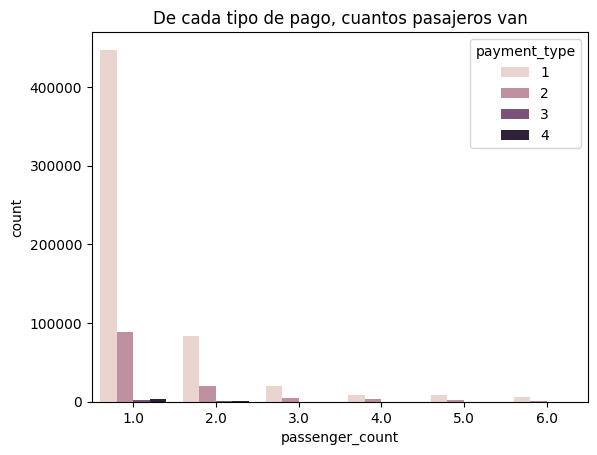

In [ ]:
sns.countplot(trips_data_total, x='passenger_count', hue='payment_type').set(title='De cada tipo de pago, cuantos pasajeros van')

Observación de análisis 5  
Se observa que casi siempre se paga con tarjeta, casi 500000 viajes de 1 persona, siendo por lejos la mas usada

Luego el pago en efectivo es el siguiente mas usado, sobre todo en viajes de 1 o 2 personas

####Análisis 6

In [ ]:
px.treemap(trips_data_total, path=['passenger_count', 'payment_type', 'RatecodeID'], title='Interrelación entre tipo de tarifa, cant. de pasajeros y tipo de pago')

Observación de análisis 6  
Aquí se observa que la mayoria de viajes son de 1 pasajero, que paga con tarjeta y hace un viaje dentro de la ciudad.  
Sin importar cantidad de pasajeros los viajes son dentro de la ciudad y en pago de tarjeta.  
Sin importar el tipo de pago la mayoría de viajes son dentro de la ciudad y de 1 pasajero.  
Sin importar a dónde es el viaje, la mayoría son de 1 pasajero que paga con tarjeta.  
  
  En general se mantiene esa jerarquia del tipo 1 al último sin importar el tipo específico donde observemos. Excepto el tipo de tarifa que sigue el siguiente orden:
  1, 2, 5, 3, 4.  
  Ordinaria, JFK, negociada, Newark, Nassau or Westchester.  

  Por ejemplo, si observamos los viajes de 4 personas y pago en efectivo. La variable faltante sigue el orden de sus tipos. Lo que siginifica que la mayoría de viajes son:  
  1. EN la ciudad  
  2. Al aeropuerto JFK  
  3. Negociada  
  4. Newark  
  5. Nassau or Westchester

In [ ]:
px.sunburst(trips_data_total, path=[ 'payment_type','RatecodeID','passenger_count'], title='Interrelación entre tipo de tarifa, cant. de pasajeros y tipo de pago')

In [ ]:
import plotly.express as px

# Diccionario para mapear valores numéricos a descripciones
payment_mapping = {
    1: 'Credit card',
    2: 'Cash',
    3: 'No charge',
    4: 'Dispute',
    5: 'Unknown',
    6: 'Voided trip'
}

# Reemplazar los valores numéricos en la columna 'payment_type' con las descripciones
trips_data_total['payment_type'] = trips_data_total['payment_type'].replace(payment_mapping)

# Crear el gráfico treemap
fig = px.treemap(trips_data_total, path=['payment_type'], values='fare_amount',
                 title='Entre más caro el precio, ¿qué tipo de pago se hizo?')

# Mostrar el gráfico
fig.show()


####Análsis 7 continuos con continuos

[Text(0.5, 1.0, '¿Que relación hay entre el tiempo y distancia')]

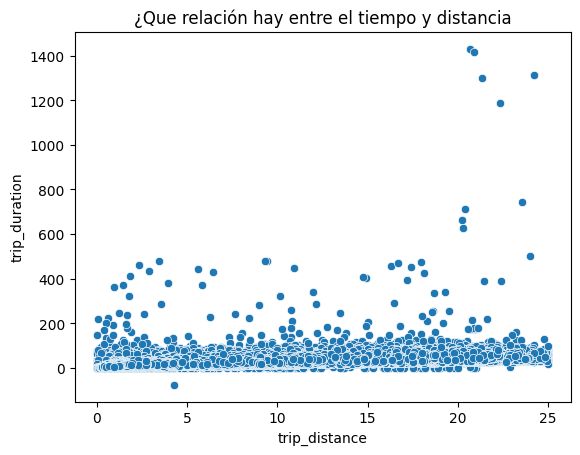

In [ ]:
trips_filter_distance = trips_data_total[trips_data_total['trip_distance'].between(0, 25)]
sns.scatterplot(trips_filter_distance, x='trip_distance', y='trip_duration').set(title='¿Que relación hay entre el tiempo y distancia' )

####Análisis 8: Relación de tiempo, distancia y precio. Limpieza

Análisis que el sentido común me diría que sí estan totalmente relacionadas.  duracion y tiempo de viaje


In [ ]:
correlation = trips['trip_distance'].corr(trips['trip_duration'])
print(f'Correlación: {correlation}')

Correlación: 0.06605856782079093


####Limpieza

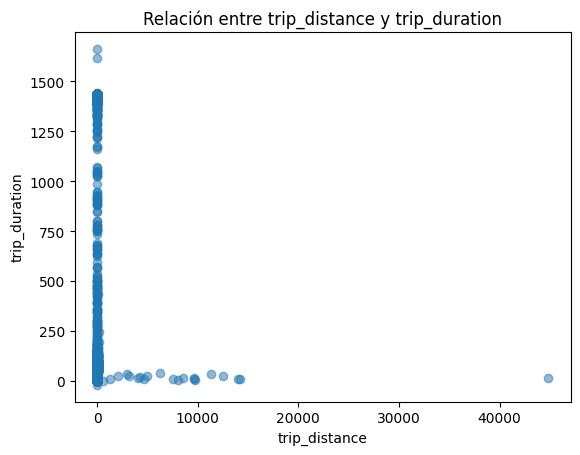

In [ ]:
plt.scatter(trips_700_mil_sin_limpiar['trip_distance'], trips_700_mil_sin_limpiar['trip_duration'], alpha=0.5)
plt.title('Relación entre trip_distance y trip_duration')
plt.xlabel('trip_distance')
plt.ylabel('trip_duration')
plt.show()


Hay unos datos que no tienen sentido. Datos en los que se recorrió muy poco en demasiado tiempo. ¿serán un error?

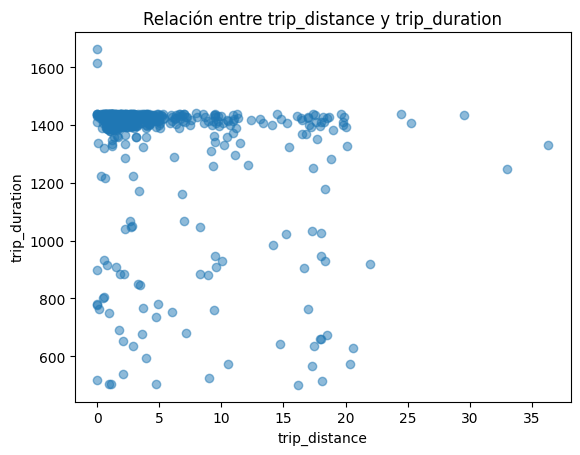

In [ ]:
trips_a_7 = trips_700_mil_sin_limpiar[trips_700_mil_sin_limpiar['trip_distance'].between(0, 14)]
trips_a_7 = trips_700_mil_sin_limpiar[trips_700_mil_sin_limpiar['trip_duration'].between(500, 2000)]
plt.scatter(trips_a_7['trip_distance'], trips_a_7['trip_duration'], alpha=0.5)
plt.title('Relación entre trip_distance y trip_duration')
plt.xlabel('trip_distance')
plt.ylabel('trip_duration')
plt.show()


In [ ]:
trips_a_7.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,trip_duration,pickup_hour_minute
2459109,2,2023-02-25 01:11:14,2023-02-26 01:11:05,1.0,7.94,1.0,N,209,89,1,...,1.0,0.5,5.82,0.0,1.0,44.62,2.5,0.00,1439.85,01:11
1386097,1,2023-01-15 19:41:51,2023-01-16 15:12:15,1.0,3.40,1.0,N,79,132,2,...,2.5,0.5,0.00,0.0,1.0,21.00,2.5,0.00,1170.40,19:41
3012631,2,2023-03-29 10:13:33,2023-03-30 09:54:40,2.0,3.10,1.0,N,263,230,1,...,0.0,0.5,7.56,0.0,1.0,45.36,2.5,0.00,1421.12,10:13
1504667,2,2023-03-15 00:18:23,2023-03-16 00:00:00,1.0,14.81,1.0,N,132,7,1,...,1.0,0.5,9.10,0.0,1.0,69.75,0.0,1.25,1421.62,00:18
1865932,2,2023-03-18 02:28:14,2023-03-19 02:14:21,1.0,1.92,1.0,N,148,249,1,...,1.0,0.5,0.00,0.0,1.0,17.10,2.5,0.00,1426.12,02:28


Pareciera que todos los datos están correctos, excepto los de pickup y dropoff. Las horas parecen estar al revés y la fecha de dropoff un dia después.  
Por ejemplo, un correcto sería:  
pickup:   2023-02-16 21:05:07  
dropoff:  2023-02-16 21:25:03
  
  pero pusieron la hora al revés y el sistema puso un día más para que tenga sentido:  
pickup:   2023-02-16 21:25:03  
dropoff:  2023-02-17 21:05:07

In [ ]:
trips_a_7.shape

(616, 21)

Veamos que pasa con los valores de distancia 0  


In [ ]:
trips_a_7 = trips_original.sample(n=10000, random_state=42)
trips_a_7 = trips_a_7[trips_a_7['trip_distance'].between(0,0.002)]
#trips_a_7 = trips[trips['trip_duration'].between(500, 2000)]

columnas_interes = ['trip_distance', 'trip_duration', 'fare_amount','RatecodeID']  # reemplaza 'otra_columna' con las columnas que te interesen
trips_a_7[columnas_interes].head()


,trip_distance,trip_duration,fare_amount,RatecodeID
2399108,0.0,0.77,3.00,1.0
272414,0.0,69.52,47.00,99.0
2132685,0.0,30.13,35.50,99.0
3352401,0.0,14.02,12.65,NaN
2906673,0.0,7.93,9.79,NaN


Observación:  
Viajes en los que no se recorrió ni un centímetro, pero duraron distitnos tiempos y sí se cobró.  
Posibles casos:  
Gente solitaria paga a choferes para platicar.  
Los choferes pactan un pago con los pasajeros y no ponen a correr el taximetro y no ponen el RateCodeIdD como tarifa negociada. Esta hipótesis se puede comprobar viendo la pickup de este viaje y la pickup del siguiente. Si están cerca es porque realmente no recorrió ninguna distancia, opuesto si está lejos.

In [ ]:
trips_a_7.shape

(143, 21)

In [ ]:
(trips_a_7['RatecodeID'].value_counts(normalize=False)
 .to_frame('Count')
 .assign(Percentage=lambda x: 100 * x['Count'] / x['Count'].sum())
)

,Count,Percentage
RatecodeID,,
1.0,79,65.289256
5.0,23,19.008264
2.0,12,9.917355
99.0,5,4.132231
3.0,2,1.652893


Aquí podemos ver que en efecto un 20% de estos viajes son pactados con el pasajero y no usan el taximetro. Y si a eso le sumamos el 15% de no identifcado tipo de tarifa y viajes al aeropuerto tenemos un 35% confirmado que se hizo un viaje no ordinario.

Estas filas las erliminamos ya que corresponden a muchos errores para el análisis de otros datos.

Comprobando la limpieza hecha

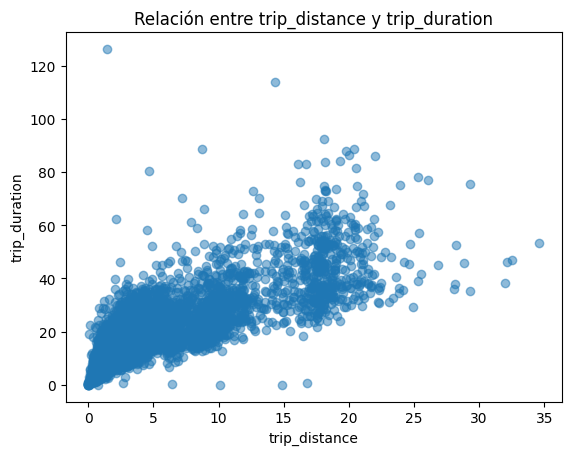

In [ ]:
trips_a_7 = trips[trips['trip_duration'].between(0, 130)]
trips_a_7 = trips_a_7[trips_a_7['trip_distance'].between(0, 35)]
plt.scatter(trips_a_7['trip_distance'], trips_a_7['trip_duration'], alpha=0.5)
plt.title('Relación entre trip_distance y trip_duration')
plt.xlabel('trip_distance')
plt.ylabel('trip_duration')
plt.show()

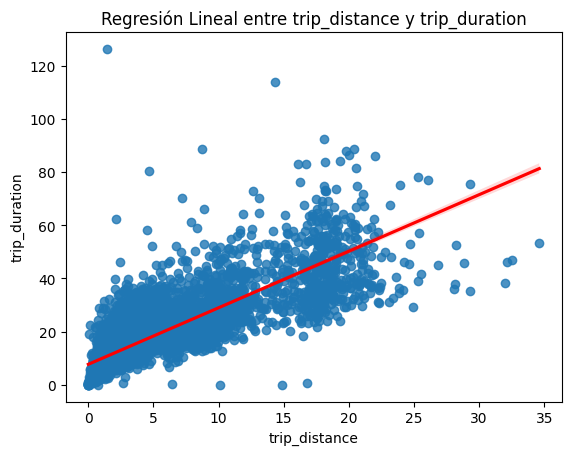

In [ ]:
sns.regplot(x='trip_distance', y='trip_duration', data=trips_a_7, line_kws={"color": "red"})
plt.title('Regresión Lineal entre trip_distance y trip_duration')
plt.show()

Se puede ver cómo si siguen cierta relación ambas variables.

####Análisis 9: Comparando días
En esta sección creamos una variable para cada día.  
También una variable días_laborales y fin_de_semana

In [ ]:
#Creo variable 'weekday_num'(lunes=1, martes=2,...domingo=7)
trips_data_total['weekday_num'] = trips_data_total['tpep_pickup_datetime'].dt.weekday + 1

#Creo variable 'hour' que redondee las horas por media horas. Por ej: 20:31 es 21, 20:29 es 20
trips_data_total['hour'] = trips_data_total['tpep_pickup_datetime'].dt.hour
trips_data_total['minute'] = trips_data_total['tpep_pickup_datetime'].dt.minute

# Función para ajustar las horas según las medias horas
def ajustar_hora(hora, minuto):
    if minuto >= 30:
        return hora + 1
    else:
        return hora

# Aplicar la función a las columnas 'hour' y 'minute'
trips_data_total['adjusted_hour'] = trips_data_total.apply(lambda row: ajustar_hora(row['hour'], row['minute']), axis=1)
trips_data_total.drop('minute', axis=1, inplace=True)

In [ ]:
trips_data_total[['tpep_pickup_datetime', 'weekday_num', 'adjusted_hour']].head()

,tpep_pickup_datetime,weekday_num,adjusted_hour
4827457,2023-02-21 06:15:44,2,6
5870140,2023-03-03 13:21:03,5,13
7404160,2023-03-18 02:22:36,6,2
6877671,2023-03-13 09:38:56,1,10
4749944,2023-02-20 00:12:49,1,0


[Text(0.5, 1.0, 'Modo de pago segun el diade la semana')]

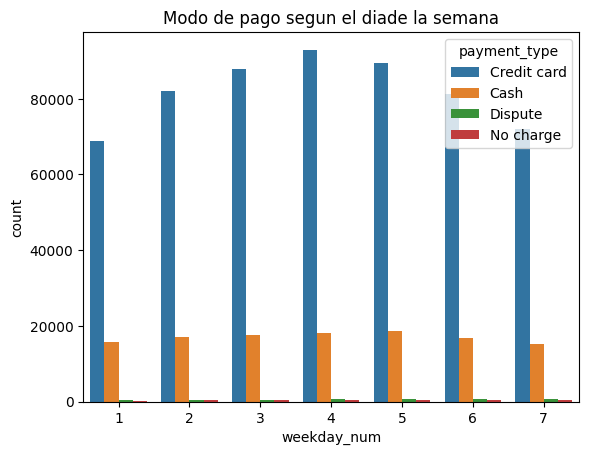

In [ ]:
sns.countplot(trips_data_total, x='weekday_num', hue='payment_type').set(title='Modo de pago segun el diade la semana')

[Text(0.5, 1.0, 'Modo de pago segun el día de la semana')]

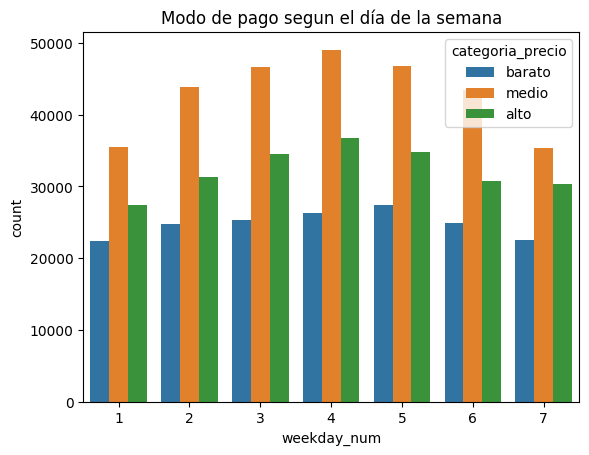

In [ ]:
# Definir los rangos de precios y las etiquetas correspondientes
bins = [0, 8.6, 17.5, 500]  # Los límites para barato, medio y alto
labels = ['barato', 'medio', 'alto']  # Etiquetas que queremos asignar

# Crear la nueva columna 'categoria_precio' basada en fare_amount
trips_data_total['categoria_precio'] = pd.cut(trips_data_total['fare_amount'], bins=bins, labels=labels, include_lowest=True)

# Mostrar las primeras filas con la nueva columna
sns.countplot(trips_data_total, x='weekday_num', hue='categoria_precio').set(title='Modo de pago segun el día de la semana')

Observación: Los domingos se hacen viajes más caros.  
La relación de los precios se mantiene sin importar el día.  


[Text(0.5, 1.0, 'Distancias segun el dia de la semana')]

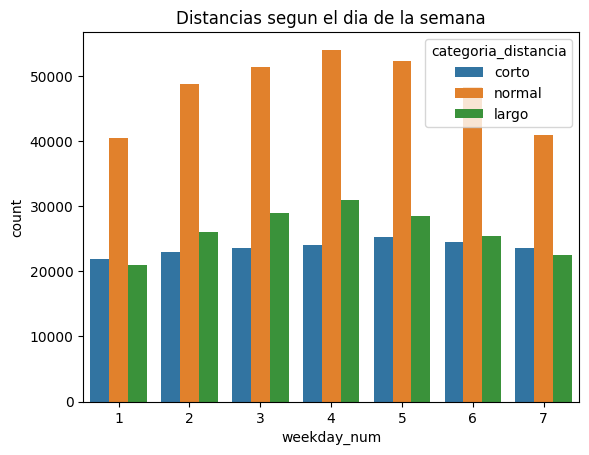

In [ ]:
# Definir los rangos de largos, datos sacados de los graficos de box de cada variable
bins = [0.02, 7.12, 17.57, 50]  # Los límites para barato, medio y alto
labels = ['corto', 'normal', 'largo']  # Etiquetas que queremos asignar

# Crear la nueva columna 'categoria_precio' basada en fare_amount
trips_data_total['categoria_distancia'] = pd.cut(trips_data_total['trip_duration'], bins=bins, labels=labels, include_lowest=True)
sns.countplot(trips_data_total, x='weekday_num', hue='categoria_distancia').set(title='Distancias segun el dia de la semana')

Observación:  
 Los domingos hay viajes más cortos.  
Los Lunes hay igual de largos qu cortos viajes.
Los viernes son los días con más viajes.

[Text(0.5, 1.0, 'Cantidad de pasajeros entre 3 y 5 en la semana')]

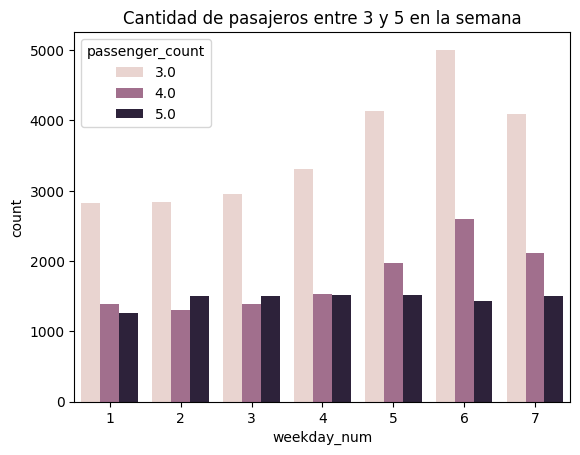

In [ ]:
trips_a_8 = trips_data_total[trips_data_total['passenger_count'].between(3, 5)]
sns.countplot(trips_a_8, x='weekday_num', hue='passenger_count').set(title='Cantidad de pasajeros entre 3 y 5 en la semana')

Observación:
Los miércoles hay más viajes de 5 personas, que de 4.

#####Días con más tráfico

In [ ]:
#Contar el número de viajes por día de la semana
dias_con_mas_trafico = trips_data_total.groupby('weekday_num').size().reset_index(name='cantidad_viajes')

#Ordenar
dias_con_mas_trafico = dias_con_mas_trafico.sort_values(by='cantidad_viajes', ascending=False)

print(dias_con_mas_trafico.to_string(index=False))


 weekday_num  cantidad_viajes
           4           112121
           5           108970
           3           106406
           2            99892
           6            99109
           7            88160
           1            85342


Observación:  
Contrario a lo que uno esperaría, los lunes es el día con menos tráfico.  
¡Felíz Jueves! El peor día para dar un paseo.

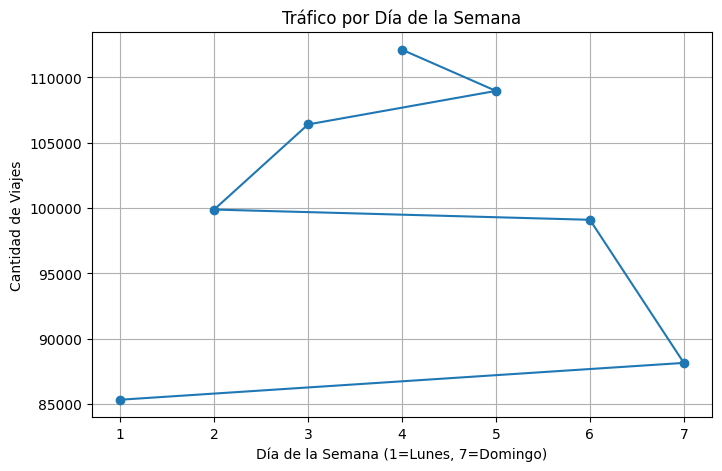

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(dias_con_mas_trafico['weekday_num'], dias_con_mas_trafico['cantidad_viajes'], marker='o')

#Añadir títulos y etiquetas
plt.title('Tráfico por Día de la Semana')
plt.xlabel('Día de la Semana (1=Lunes, 7=Domingo)')
plt.ylabel('Cantidad de Viajes')
plt.grid(True)
plt.show()


#####Horas con más tráfico

In [ ]:
#Horas con más tráfico de taxis
# Contar el número de viajes por hora ajustada
horas_con_mas_trafico = trips_data_total.groupby('adjusted_hour').size().reset_index(name='cantidad_viajes')

# Ordenar por la cantidad de viajes en orden descendente
horas_con_mas_trafico = horas_con_mas_trafico.sort_values(by='cantidad_viajes', ascending=False)

# Mostrar las horas con más tráfico
horas_con_mas_trafico

,adjusted_hour,cantidad_viajes
18,18,49868
19,19,48411
17,17,46002
15,15,44063
16,16,43768
14,14,41719
20,20,41573
13,13,38784
21,21,38598
22,22,37807


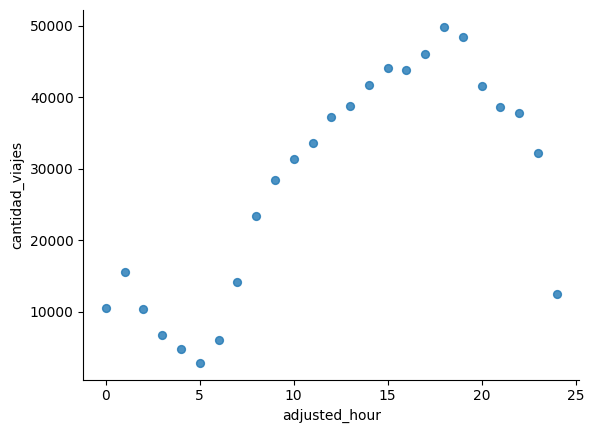

In [ ]:
from matplotlib import pyplot as plt
horas_con_mas_trafico.plot(kind='scatter', x='adjusted_hour', y='cantidad_viajes', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

#####Horas con mas trafico segun el dia

In [ ]:
# Contar el número de viajes por día de la semana y hora ajustada
horarios_con_mas_trafico = trips_data_total.groupby(['weekday_num', 'adjusted_hour']).size().reset_index(name='cantidad_viajes')

# Ordenar por la cantidad de viajes en orden descendente
horarios_con_mas_trafico = horarios_con_mas_trafico.sort_values(by='cantidad_viajes', ascending=False)

# Mostrar los horarios con más tráfico
horarios_con_mas_trafico

,weekday_num,adjusted_hour,cantidad_viajes
93,4,18,8354
94,4,19,8069
68,3,18,7989
69,3,19,7877
119,5,19,7765
...,...,...,...
30,2,5,277
53,3,3,249
54,3,4,224
28,2,3,197


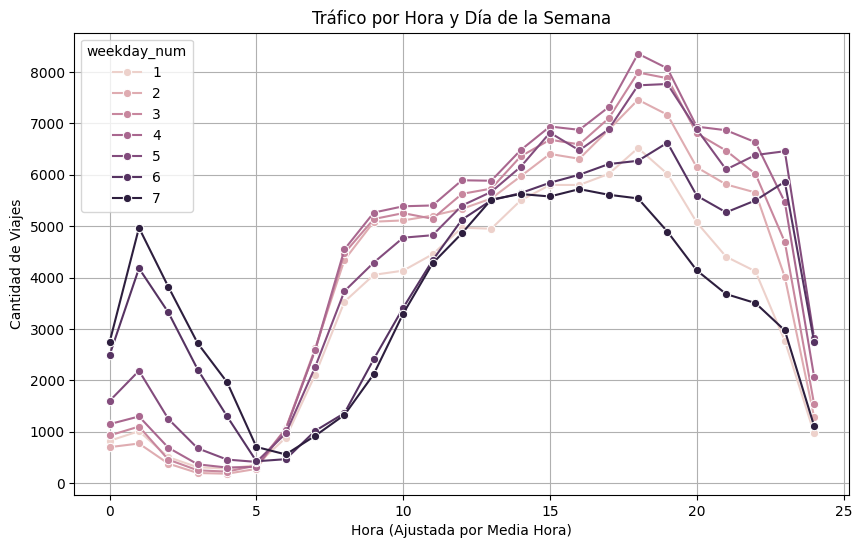

In [ ]:
import seaborn as sns

# Graficar tráfico por horario y día de la semana
plt.figure(figsize=(10, 6))
sns.lineplot(x='adjusted_hour', y='cantidad_viajes', hue='weekday_num', data=horarios_con_mas_trafico, marker='o')

# Añadir títulos y etiquetas
plt.title('Tráfico por Hora y Día de la Semana')
plt.xlabel('Hora (Ajustada por Media Hora)')
plt.ylabel('Cantidad de Viajes')
plt.grid(True)
plt.show()

Observación:  
Los días sábados y domingos en la madrugada hay mucho movimiento. Alrededor de las 2am las personas vuelven a sus casas de una salida un sabado o viernes por la noche.  
Día nocturno: En un sábado salen a las 19 y regresan a la 1am.  
Los viernes a las 19 hay mucho trafico por personas volviendo a sus casas y otras saliendo. La deducción es porque el sábado a la 1 am también ay mucho movimiento.  
Los sábados la gente que sale a las 19 puede estar regresando a las 23. Si no regresan a las 23 se quedan hasta la 1 am.  
Bajan muchos los ciajes entre las 23 a 1.
Los domingos salen a las 13 y regresan a las 18.  


Los viernes y sábados que son los días de más salidas nocturnas, estudiemos si en las tardes la cantdad de pasajeros son 1 y al regreso son más.

In [ ]:
trips_data_total['tpep_pickup_datetime'] = pd.to_datetime(trips_data_total['tpep_pickup_datetime'])

# viernes y sábados
trips_data_total['day_of_week'] = trips_data_total['tpep_pickup_datetime'].dt.day_name()
weekend_trips = trips_data_total[trips_data_total['day_of_week'].isin(['Friday', 'Saturday'])]

tarde_trips = weekend_trips[(weekend_trips['tpep_pickup_datetime'].dt.hour >=17 ) &
                            (weekend_trips['tpep_pickup_datetime'].dt.hour < 20)]

regreso_trips = weekend_trips[(weekend_trips['tpep_pickup_datetime'].dt.hour >= 0) &
                              (weekend_trips['tpep_pickup_datetime'].dt.hour < 4)]

# Contar la cantidad de pasajeros en ambos periodos
tarde_count = tarde_trips.shape[0]
regreso_count = regreso_trips.shape[0]

# Contar la cantidad de pasajeros en cada periodo
tarde_count_1 = tarde_trips[tarde_trips['passenger_count'] == 1].shape[0]
tarde_count_more = tarde_trips[tarde_trips['passenger_count'] > 1].shape[0]

regreso_count_1 = regreso_trips[regreso_trips['passenger_count'] == 1].shape[0]
regreso_count_more = regreso_trips[regreso_trips['passenger_count'] > 1].shape[0]

print(f"Viajes en la tarde con 1 o más pasajeros: {tarde_count}")
print(f"  - Viajes en la tarde con 1 pasajero: {tarde_count_1}")
print(f"  - Viajes en la tarde con más de 1 pasajero: {tarde_count_more}")

print(f"Viajes de regreso con 1 o más pasajeros: {regreso_count}")
print(f"  - Viajes de regreso con 1 pasajero: {regreso_count_1}")
print(f"  - Viajes de regreso con más de 1 pasajero: {regreso_count_more}")


Viajes en la tarde con 1 o más pasajeros: 41787
  - Viajes en la tarde con 1 pasajero: 30255
  - Viajes en la tarde con más de 1 pasajero: 11532
Viajes de regreso con 1 o más pasajeros: 18909
  - Viajes de regreso con 1 pasajero: 13980
  - Viajes de regreso con más de 1 pasajero: 4929


La proporción es que sí hay más viajes de gente acompañada al regreso que en la salida.